In [1]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from pytorchvideo.data import Kinetics, RandomClipSampler
from pytorchvideo.transforms import (
    ApplyTransformToKey,
    Normalize,
    RandomResizedCrop,
    Div255,
    Permute
)

from torchvision.transforms import (
    Compose,
    RandomHorizontalFlip
)
from tqdm import tqdm

import sys
sys.path.insert(1, '../src')
from random_temporal_subsample import RandomTemporalSubsample
from vit import Embedding, CrossSelfDecoder, ViT_Encoder, Masking

/Users/aweers/git/dd2412_project/env/lib/python3.10/site-packages/torchvision/transforms/functional_tensor.py:5: UserWarning: The torchvision.transforms.functional_tensor module is deprecated in 0.15 and will be **removed in 0.17**. Please don't rely on it. You probably just need to use APIs in torchvision.transforms.functional or in torchvision.transforms.v2.functional.
  warnings.warn(


# Overfit to one sample

In [2]:
BATCH_SIZE = 1
NUM_WORKERS = 0 # Has to be 0 for jupyter notebooks
CHANNELS = 3
IMAGE_SIZE = 224
REPEATED_SAMPLING_FACTOR = 2

# ViT hyperparameters
patch_size = 32
D = 128
encoder_heads = 8
encoder_layers = 2
encoder_mlp_dim = 128
decoder_heads = 8
decoder_layers = 2
decoder_mlp_dim = 128
mlp_activation = nn.ReLU()

# masking
mask_ratio = 0.6
mask_type = 'random'

# other hyperparameters
frame_gap_range = (4, 5)
fps = 29


# Calculated parameters
clip_duration = frame_gap_range[1] / fps + 0.0001

device = torch.device("cpu")
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
    
print("Using device =", device)

Using device = mps


In [3]:
transform = Compose(
    [
    ApplyTransformToKey(
        key="video",
        transform=Compose(
            [
            RandomTemporalSubsample(frame_gap_range[0], frame_gap_range[1], repeated_sampling=REPEATED_SAMPLING_FACTOR),
            RandomResizedCrop(IMAGE_SIZE, IMAGE_SIZE, scale=(0.2, 1.0), aspect_ratio=(1.0, 1.0), interpolation='bilinear'),
            Div255(),
            # mean and std from ImageNet
            Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
            # Permute to get Frames, Channel, Height, Width
            Permute((1, 0, 2, 3)),
            RandomHorizontalFlip(p=0.5)
            ]
        ),
        ),
    ]
)

def unnormalize(tensor):
    return tensor * torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1) + torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)

In [4]:
data = Kinetics("../data/", clip_sampler=RandomClipSampler(clip_duration=clip_duration), decode_audio=False, transform=transform)

In [5]:
print(data.num_videos)

dloader = torch.utils.data.DataLoader(
        data,
        batch_size=BATCH_SIZE,
        num_workers=NUM_WORKERS
    )

1365


In [10]:
# Create ViT
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

encoder = ViT_Encoder(D, encoder_heads, (encoder_mlp_dim, mlp_activation), encoder_layers)
decoder = CrossSelfDecoder(D, decoder_heads, (decoder_mlp_dim, mlp_activation), decoder_layers)
masking = Masking(D)
embedding = Embedding(D, patch_size, CHANNELS, IMAGE_SIZE//patch_size * IMAGE_SIZE//patch_size, masking)

embedding.train(), encoder.train(), decoder.train(), masking.train()

embedding.to(device)
encoder.to(device)
decoder.to(device)
masking.to(device)

embedding_params = count_parameters(embedding)
encoder_params = count_parameters(encoder)
decoder_params = count_parameters(decoder)
masking_params = count_parameters(masking)

model = (embedding, encoder, decoder, masking)

print("Embedding parameters:", embedding_params)
print("Encoder parameters:", encoder_params)
print("Decoder parameters:", decoder_params)
print("Masking parameters:", masking_params)
print("Total parameters:", embedding_params + encoder_params + decoder_params + masking_params)

Embedding parameters: 806272
Encoder parameters: 199168
Decoder parameters: 331776
Masking parameters: 128
Total parameters: 1337344


In [11]:
def validate(model, dataloader, loss_fn):
    return 0.0

DEBUG = False
def train(model, dataloader, vdataloader, loss_fn, optimizer, epochs):
    batch_orig = None
    for b in dataloader:
        batch_orig = b
        break
    train_loss = []
    val_loss = []
    embedding, encoder, decoder, masking = model
    for epoch in range(epochs):
        epoch_loss = 0
        #for batch_nr, batch in enumerate(dataloader):
        #for batch_nr, batch in enumerate(tqdm(dataloader, total=data.num_videos//BATCH_SIZE)):
        batch = batch_orig

        # batch.shape = (batch_size, repeated_sampled_frames, channels, height, width)
        # change to (batch_size * repeated_sampled_frames, channels, height, width)
        batch_size = batch['video'].shape[0] # actual batch size (important for last batch)
        batch = batch['video'].to(device)
        images = batch.view(-1, CHANNELS, IMAGE_SIZE, IMAGE_SIZE)
        if DEBUG: print("images.shape: ", images.shape)
        optimizer.zero_grad()
        # embedding
        embeddings = embedding.embedding(images).view(batch_size, REPEATED_SAMPLING_FACTOR+1, -1, D)
        #print(embeddings[0, 0, 0, :5])
        if DEBUG: print("Embeddings.shape: ", embeddings.shape)

        # masking
        first_frame = embeddings[:, 0, :, :]
        if DEBUG: print("First_frame.shape: ", first_frame.shape)
        future_frames, shuff_idx, skipped_token = masking.mask(embeddings[:, 1:, :, :].reshape(batch_size*REPEATED_SAMPLING_FACTOR, -1, D), mask_ratio, mask_type)
        n_embeddings = future_frames.shape[-2]
        if DEBUG: print("Future_frames.shape: ", future_frames.shape)

        # encoder
        first_frame = encoder(first_frame)
        if DEBUG: print("First_frame.shape (after encoding): ", first_frame.shape)
        future_frames = encoder(future_frames)
        #print(future_frames[0, 0, :5])
        if DEBUG: print("Future_frames.shape (after encoding): ", future_frames.shape)

        # unmasking
        future_frames = embedding.decoder_embedding(future_frames, mask_type, shuff_idx, skipped_token)
        if DEBUG: print("Future_frames.shape (after unmasking): ", future_frames.shape)

        # decoder (future_frames is the query, first_frame provide key and value)
        # future_frames.shape = (batch_size * repeated_sampled_frames, N, D)
        # first_frame.shape = (batch_size, N, D)
        
        # TODO: check if this is correct
        output = decoder(future_frames, first_frame.repeat(1, REPEATED_SAMPLING_FACTOR, 1).view(batch_size*REPEATED_SAMPLING_FACTOR, -1, D))
        #output = decoder(first_frame.repeat(1, REPEATED_SAMPLING_FACTOR, 1).view(batch_size*REPEATED_SAMPLING_FACTOR, -1, D), future_frames)
        if DEBUG: print("Output.shape: ", output.shape)
        #print(output[0, 0, :5])

        # unembedding
        output = embedding.unembedding(output)
        if DEBUG: print("Output.shape (after unembedding): ", output.shape)

        # calculate loss
        #loss = loss_fn(output.reshape(-1, 1), batch[:, 1:, :, :, :].reshape(-1, 1))
        mask = masking.create_mask(IMAGE_SIZE//patch_size, mask_type, shuff_idx, skipped_token, H=IMAGE_SIZE, W=IMAGE_SIZE, device=device)
        
        # Loss is calculated only on the masked tokens (MAE)
        loss = (loss_fn(output, batch[:, 1:].reshape(-1, CHANNELS, IMAGE_SIZE, IMAGE_SIZE)) * mask).sum() / mask.sum()

        # Loss is calculated on all tokens (SiamMAE)
        #loss = loss_fn(output, batch[:, 1:].reshape(-1, CHANNELS, IMAGE_SIZE, IMAGE_SIZE)).mean()

        epoch_loss += loss.item()
        loss.backward()
        optimizer.step()

        train_loss.append(epoch_loss/(data.num_videos//BATCH_SIZE))
        val_loss.append(validate(model, vdataloader, loss_fn))
        if epoch % 800 == 0:
            print("Epoch", epoch, "Training loss:", train_loss[-1], "Validation loss:", val_loss[-1])
            # plot image
            fig, ax = plt.subplots(1, 4)
            
            ax[0].imshow(unnormalize(batch[0, 0, :, :, :].detach().cpu()).permute(1, 2, 0).numpy())
            ax[1].imshow(unnormalize(batch[0, 1, :, :, :].detach().cpu()).permute(1, 2, 0).numpy())
            ax[2].imshow(unnormalize(output[0, :, :, :].detach().cpu()).permute(1, 2, 0).numpy())
            ax[3].imshow(mask[0, :, :].permute(1, 2, 0).detach().cpu().numpy())
            plt.show()
    return train_loss, val_loss


In [12]:
optimizer = torch.optim.AdamW(list(embedding.parameters()) + list(encoder.parameters()) + list(decoder.parameters()) + list(masking.parameters()), lr=3e-4, betas=(0.9, 0.95), weight_decay=0.05)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 0 Training loss: 0.002438464356866075 Validation loss: 0.0


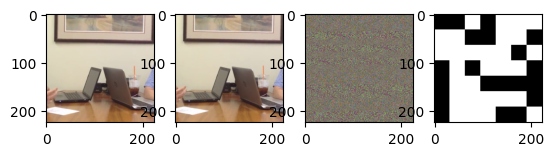

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 800 Training loss: 0.0002442584587977483 Validation loss: 0.0


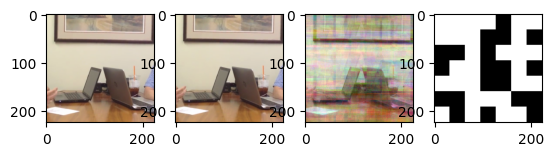

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 1600 Training loss: 4.5562909417973336e-05 Validation loss: 0.0


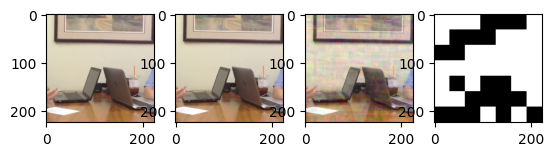

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 2400 Training loss: 1.1535870395737253e-05 Validation loss: 0.0


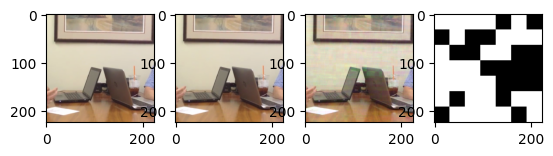

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 3200 Training loss: 4.966093070341117e-06 Validation loss: 0.0


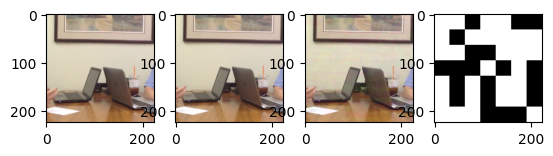

In [13]:
#with torch.autograd.detect_anomaly():
train_loss, val_loss = train(model, dloader, dloader, nn.MSELoss(reduction='none'), optimizer, 4000)

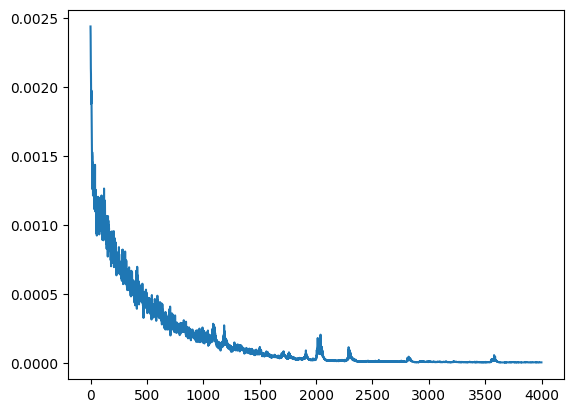

In [14]:
plt.plot(train_loss, label="Training loss")

Overfitting to one sample works! (Note that the loss is way too small, due to the division by the whole dataset size)

In [15]:
# 8 examples

BATCH_SIZE = 8
NUM_WORKERS = 0 # Has to be 0 for jupyter notebooks
CHANNELS = 3
IMAGE_SIZE = 100
REPEATED_SAMPLING_FACTOR = 1

# ViT hyperparameters
patch_size = 10
D = 128
encoder_heads = 8
encoder_layers = 2
encoder_mlp_dim = 128
decoder_heads = 8
decoder_layers = 2
decoder_mlp_dim = 128
mlp_activation = nn.GELU()

# masking
mask_ratio = 0.5
mask_type = 'random'

# other hyperparameters
frame_gap_range = (14, 15)
fps = 29


# Calculated parameters
clip_duration = frame_gap_range[1] / fps + 0.0001

device = torch.device("cpu")
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
    
print("Using device =", device)

Using device = mps


In [16]:
transform = Compose(
    [
    ApplyTransformToKey(
        key="video",
        transform=Compose(
            [
            RandomTemporalSubsample(frame_gap_range[0], frame_gap_range[1], repeated_sampling=REPEATED_SAMPLING_FACTOR),
            RandomResizedCrop(IMAGE_SIZE, IMAGE_SIZE, scale=(0.2, 1.0), aspect_ratio=(1.0, 1.0), interpolation='bilinear'),
            Div255(),
            # mean and std from ImageNet
            Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
            # Permute to get Frames, Channel, Height, Width
            Permute((1, 0, 2, 3)),
            RandomHorizontalFlip(p=0.5)
            ]
        ),
        ),
    ]
)

def unnormalize(tensor):
    return tensor * torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1) + torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)

data = Kinetics("../data/", clip_sampler=RandomClipSampler(clip_duration=clip_duration), decode_audio=False, transform=transform)

In [17]:
print(data.num_videos)

dloader = torch.utils.data.DataLoader(
        data,
        batch_size=BATCH_SIZE,
        num_workers=NUM_WORKERS
    )

1365


In [18]:
# Create ViT
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

encoder = ViT_Encoder(D, encoder_heads, (encoder_mlp_dim, mlp_activation), encoder_layers)
decoder = CrossSelfDecoder(D, decoder_heads, (decoder_mlp_dim, mlp_activation), decoder_layers)
masking = Masking(D)
embedding = Embedding(D, patch_size, CHANNELS, IMAGE_SIZE//patch_size * IMAGE_SIZE//patch_size, masking)

embedding.train(), encoder.train(), decoder.train(), masking.train()

embedding.to(device)
encoder.to(device)
decoder.to(device)
masking.to(device)

embedding_params = count_parameters(embedding)
encoder_params = count_parameters(encoder)
decoder_params = count_parameters(decoder)
masking_params = count_parameters(masking)

model = (embedding, encoder, decoder, masking)

print("Embedding parameters:", embedding_params)
print("Encoder parameters:", encoder_params)
print("Decoder parameters:", decoder_params)
print("Masking parameters:", masking_params)
print("Total parameters:", embedding_params + encoder_params + decoder_params + masking_params)

Embedding parameters: 93868
Encoder parameters: 199168
Decoder parameters: 331776
Masking parameters: 128
Total parameters: 624940


In [19]:
def validate(model, dataloader, loss_fn):
    return 0.0

DEBUG = False
def train(model, dataloader, vdataloader, loss_fn, optimizer, epochs):
    batch_orig = None
    for b in dataloader:
        batch_orig = b
        break
    N = IMAGE_SIZE//patch_size * IMAGE_SIZE//patch_size
    train_loss = []
    val_loss = []
    embedding, encoder, decoder, masking = model
    for epoch in range(epochs):
        epoch_loss = 0
        #for batch_nr, batch in enumerate(dataloader):
        #for batch_nr, batch in enumerate(tqdm(dataloader, total=data.num_videos//BATCH_SIZE)):
        batch = batch_orig

        batch = batch['video'].to(device) # batch.shape = (batch_size, 1+repeated_sampled_frames, channels, height, width) // [6, 3, 224, 224]
        batch_size = batch.shape[0] # actual batch size (important for last batch)
        images = batch.view(-1, CHANNELS, IMAGE_SIZE, IMAGE_SIZE)
        if DEBUG: print("images.shape: ", images.shape)
        optimizer.zero_grad()
        # embedding
        embeddings = embedding.embedding(images).view(batch_size, REPEATED_SAMPLING_FACTOR+1, -1, D)
        #print(embeddings[0, 0, 0, :5])
        if DEBUG: print("Embeddings.shape: ", embeddings.shape)

        # masking
        first_frame = embeddings[:, 0, :, :]
        if DEBUG: print("First_frame.shape: ", first_frame.shape)
        future_frames, shuff_idx, skipped_token = masking.mask(embeddings[:, 1:, :, :].reshape(batch_size*REPEATED_SAMPLING_FACTOR, -1, D), mask_ratio, mask_type)
        n_embeddings = future_frames.shape[-2]
        if DEBUG: print("Future_frames.shape: ", future_frames.shape)

        # encoder
        first_frame = encoder(first_frame)
        if DEBUG: print("First_frame.shape (after encoding): ", first_frame.shape)
        future_frames = encoder(future_frames)
        #print(future_frames[0, 0, :5])
        if DEBUG: print("Future_frames.shape (after encoding): ", future_frames.shape)

        # unmasking
        future_frames = embedding.decoder_embedding(future_frames, mask_type, shuff_idx, skipped_token)
        if DEBUG: print("Future_frames.shape (after unmasking): ", future_frames.shape)

        # decoder (future_frames is the query, first_frame provide key and value)
        # future_frames.shape = (batch_size * repeated_sampled_frames, N, D)
        # first_frame.shape = (batch_size, N, D)
        
        # TODO: check if this is correct
        output = decoder(future_frames, first_frame.repeat(1, REPEATED_SAMPLING_FACTOR, 1).view(batch_size*REPEATED_SAMPLING_FACTOR, -1, D))
        #output = decoder(first_frame.repeat(1, REPEATED_SAMPLING_FACTOR, 1).view(batch_size*REPEATED_SAMPLING_FACTOR, -1, D), future_frames)
        if DEBUG: print("Output.shape: ", output.shape)
        #print(output[0, 0, :5])

        # unembedding
        output = embedding.unembedding(output)
        if DEBUG: print("Output.shape (after unembedding): ", output.shape)

        # calculate loss
        #loss = loss_fn(output.reshape(-1, 1), batch[:, 1:, :, :, :].reshape(-1, 1))
        mask = masking.create_mask(IMAGE_SIZE//patch_size, mask_type, shuff_idx, skipped_token, H=IMAGE_SIZE, W=IMAGE_SIZE, device=device)
        
        # Loss is calculated only on the masked tokens (MAE)
        loss = (loss_fn(output, batch[:, 1:].reshape(-1, CHANNELS, IMAGE_SIZE, IMAGE_SIZE)) * mask).sum() / mask.sum()

        # Loss is calculated on all tokens (SiamMAE)
        #loss = loss_fn(output, batch[:, 1:].reshape(-1, CHANNELS, IMAGE_SIZE, IMAGE_SIZE)).mean()

        epoch_loss += loss.item()
        loss.backward()
        optimizer.step()

        train_loss.append(epoch_loss/(data.num_videos//BATCH_SIZE))
        val_loss.append(validate(model, vdataloader, loss_fn))
        if epoch % 800 == 0:
            print("Epoch", epoch, "Training loss:", train_loss[-1], "Validation loss:", val_loss[-1])
            # plot image
            fig, ax = plt.subplots(3, 4)
            for i in range(3):
                ax[i, 0].imshow(unnormalize(batch[i, 0, :, :, :].detach().cpu()).permute(1, 2, 0).numpy())
                ax[i, 1].imshow(unnormalize(batch[i, 1, :, :, :].detach().cpu()).permute(1, 2, 0).numpy())
                ax[i, 2].imshow(unnormalize(output[i*REPEATED_SAMPLING_FACTOR, :, :, :].detach().cpu()).permute(1, 2, 0).numpy())
                ax[i, 3].imshow(mask[0, :, :].permute(1, 2, 0).detach().cpu().numpy())
            plt.show()
    return train_loss, val_loss


In [20]:
optimizer = torch.optim.AdamW(list(embedding.parameters()) + list(encoder.parameters()) + list(decoder.parameters()) + list(masking.parameters()), lr=3e-4, betas=(0.9, 0.95), weight_decay=0.05)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 0 Training loss: 0.16004516377168543 Validation loss: 0.0


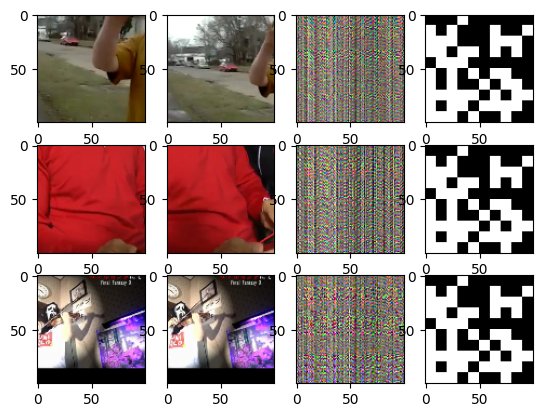

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 800 Training loss: 0.013061969420489143 Validation loss: 0.0


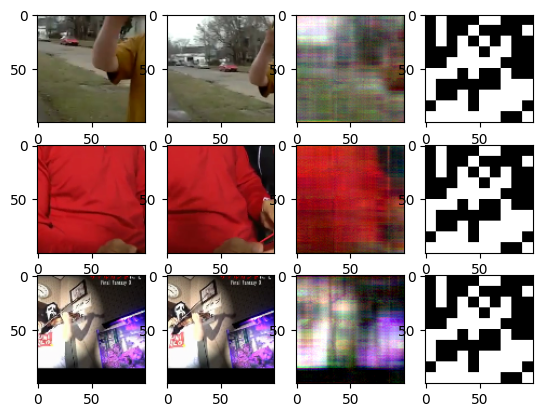

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 1600 Training loss: 0.007681263895595775 Validation loss: 0.0


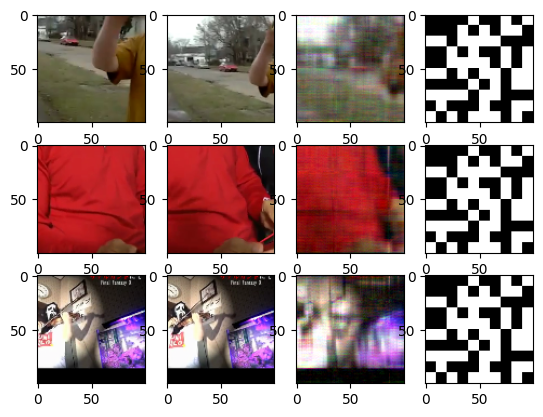

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 2400 Training loss: 0.005195796489715576 Validation loss: 0.0


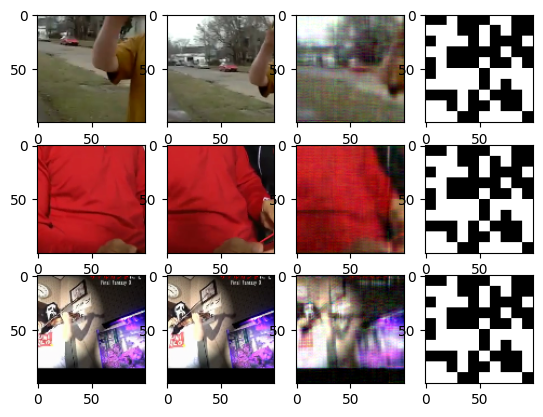

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 3200 Training loss: 0.004157528456519632 Validation loss: 0.0


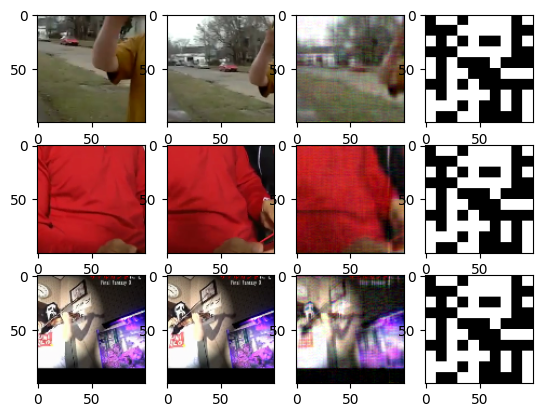

In [21]:
train_loss, val_loss = train(model, dloader, dloader, nn.MSELoss(reduction='none'), optimizer, 4000)

In [22]:
masking.mask_token

Parameter containing:
tensor([[[ 0.0196, -0.0029,  0.0187,  0.0002, -0.0034, -0.0142,  0.0018,
          -0.0047, -0.0229, -0.0055, -0.0163, -0.0083, -0.0228, -0.0042,
          -0.0077, -0.0181,  0.0220,  0.0154,  0.0315,  0.0314, -0.0159,
           0.0069, -0.0202,  0.0015, -0.0008,  0.0386,  0.0075,  0.0158,
          -0.0233, -0.0277, -0.0056,  0.0221,  0.0041, -0.0078,  0.0508,
           0.0235, -0.0353, -0.0090, -0.0059, -0.0388, -0.0368,  0.0191,
          -0.0264, -0.0037, -0.0216,  0.0045,  0.0064, -0.0110, -0.0193,
          -0.0457,  0.0123,  0.0005,  0.0066, -0.0447,  0.0210, -0.0154,
           0.0093, -0.0113, -0.0163, -0.0027, -0.0244, -0.0442, -0.0137,
          -0.0074, -0.0050,  0.0207, -0.0185,  0.0025, -0.0453,  0.0005,
          -0.0200, -0.0200, -0.0061, -0.0036, -0.0109,  0.0295, -0.0330,
          -0.0262, -0.0141, -0.0306, -0.0314,  0.0405,  0.0051,  0.0108,
           0.0008, -0.0112,  0.0037, -0.0219,  0.0042, -0.0038,  0.0161,
           0.0012, -0.0227,  

In [40]:
BATCH_SIZE = 16
NUM_WORKERS = 0 # Has to be 0 for jupyter notebooks
CHANNELS = 3
IMAGE_SIZE = 48
REPEATED_SAMPLING_FACTOR = 4

# ViT hyperparameters
patch_size = 6
D = 192
encoder_heads = 8
encoder_layers = 4
encoder_mlp_dim = 128
decoder_heads = 8
decoder_layers = 4
decoder_mlp_dim = 128
mlp_activation = nn.GELU()

# masking
mask_ratio = 0.5
mask_type = 'random'

# other hyperparameters
frame_gap_range = (14, 25)
fps = 29


# Calculated parameters
clip_duration = frame_gap_range[1] / fps + 0.0001

device = torch.device("cpu")
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
    
print("Using device =", device)

Using device = mps


In [41]:
transform = Compose(
    [
    ApplyTransformToKey(
        key="video",
        transform=Compose(
            [
            RandomTemporalSubsample(frame_gap_range[0], frame_gap_range[1], repeated_sampling=REPEATED_SAMPLING_FACTOR),
            RandomResizedCrop(IMAGE_SIZE, IMAGE_SIZE, scale=(0.2, 1.0), aspect_ratio=(1.0, 1.0), interpolation='bilinear'),
            Div255(),
            # mean and std from ImageNet
            Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
            # Permute to get Frames, Channel, Height, Width
            Permute((1, 0, 2, 3)),
            RandomHorizontalFlip(p=0.5)
            ]
        ),
        ),
    ]
)

def unnormalize(tensor):
    return tensor * torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1) + torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
data = Kinetics("../data1/", clip_sampler=RandomClipSampler(clip_duration=clip_duration), decode_audio=False, transform=transform)

dloader = torch.utils.data.DataLoader(
        data,
        batch_size=BATCH_SIZE,
        num_workers=NUM_WORKERS,
        shuffle=False
    )

In [42]:
# Create ViT
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

encoder = ViT_Encoder(D, encoder_heads, (encoder_mlp_dim, mlp_activation), encoder_layers)
decoder = CrossSelfDecoder(D, decoder_heads, (decoder_mlp_dim, mlp_activation), decoder_layers)
masking = Masking(D)
embedding = Embedding(D, patch_size, CHANNELS, IMAGE_SIZE//patch_size * IMAGE_SIZE//patch_size, masking)

embedding.train(), encoder.train(), decoder.train(), masking.train()

embedding.to(device)
encoder.to(device)
decoder.to(device)
masking.to(device)

embedding_params = count_parameters(embedding)
encoder_params = count_parameters(encoder)
decoder_params = count_parameters(decoder)
masking_params = count_parameters(masking)

model = (embedding, encoder, decoder, masking)

print("Embedding parameters:", embedding_params)
print("Encoder parameters:", encoder_params)
print("Decoder parameters:", decoder_params)
print("Masking parameters:", masking_params)
print("Total parameters:", embedding_params + encoder_params + decoder_params + masking_params)

Embedding parameters: 79020
Encoder parameters: 793856
Decoder parameters: 1388288
Masking parameters: 192
Total parameters: 2261356


In [43]:
def validate(model, dataloader, loss_fn):
    return 0.0

DEBUG = False
def train(model, dataloader, vdataloader, loss_fn, optimizer, epochs):
    batch_orig = None
    for b in dataloader:
        batch_orig = b
        break
    train_loss = []
    val_loss = []
    embedding, encoder, decoder, masking = model
    for epoch in range(epochs):
        epoch_loss = []
        #for batch_nr, batch in enumerate(dataloader):
        for batch_nr, batch in enumerate(tqdm(dataloader, total=data.num_videos//BATCH_SIZE)):

            # batch.shape = (batch_size, repeated_sampled_frames, channels, height, width)
            # change to (batch_size * repeated_sampled_frames, channels, height, width)
            batch_size = batch['video'].shape[0] # actual batch size (important for last batch)
            batch = batch['video'].to(device)
            images = batch.view(-1, CHANNELS, IMAGE_SIZE, IMAGE_SIZE)
            if DEBUG: print("images.shape: ", images.shape)
            optimizer.zero_grad()
            # embedding
            embeddings = embedding.embedding(images).view(batch_size, REPEATED_SAMPLING_FACTOR+1, -1, D)
            #print(embeddings[0, 0, 0, :5])
            if DEBUG: print("Embeddings.shape: ", embeddings.shape)

            # masking
            first_frame = embeddings[:, 0, :, :]
            if DEBUG: print("First_frame.shape: ", first_frame.shape)
            future_frames, shuff_idx, skipped_token = masking.mask(embeddings[:, 1:, :, :].reshape(batch_size*REPEATED_SAMPLING_FACTOR, -1, D), mask_ratio, mask_type)
            n_embeddings = future_frames.shape[-2]
            if DEBUG: print("Future_frames.shape: ", future_frames.shape)

            # encoder
            first_frame = encoder(first_frame)
            if DEBUG: print("First_frame.shape (after encoding): ", first_frame.shape)
            future_frames = encoder(future_frames)
            #print(future_frames[0, 0, :5])
            if DEBUG: print("Future_frames.shape (after encoding): ", future_frames.shape)

            # unmasking
            future_frames = embedding.decoder_embedding(future_frames, mask_type, shuff_idx, skipped_token)
            if DEBUG: print("Future_frames.shape (after unmasking): ", future_frames.shape)

            # decoder (future_frames is the query, first_frame provide key and value)
            # future_frames.shape = (batch_size * repeated_sampled_frames, N, D)
            # first_frame.shape = (batch_size, N, D)
            
            # TODO: check if this is correct
            output = decoder(future_frames, first_frame.repeat(1, REPEATED_SAMPLING_FACTOR, 1).view(batch_size*REPEATED_SAMPLING_FACTOR, -1, D))
            #output = decoder(first_frame.repeat(1, REPEATED_SAMPLING_FACTOR, 1).view(batch_size*REPEATED_SAMPLING_FACTOR, -1, D), future_frames)
            if DEBUG: print("Output.shape: ", output.shape)
            #print(output[0, 0, :5])

            # unembedding
            output = embedding.unembedding(output)
            if DEBUG: print("Output.shape (after unembedding): ", output.shape)

            # calculate loss
            #loss = loss_fn(output.reshape(-1, 1), batch[:, 1:, :, :, :].reshape(-1, 1))
            mask = masking.create_mask(IMAGE_SIZE//patch_size, mask_type, shuff_idx, skipped_token, H=IMAGE_SIZE, W=IMAGE_SIZE, device=device)
            
            # Loss is calculated only on the masked tokens (MAE)
            loss = (loss_fn(output, batch[:, 1:].reshape(-1, CHANNELS, IMAGE_SIZE, IMAGE_SIZE)) * mask).sum() / mask.sum()

            # Loss is calculated on all tokens (SiamMAE)
            #loss = loss_fn(output, batch[:, 1:].reshape(-1, CHANNELS, IMAGE_SIZE, IMAGE_SIZE)).mean()

            epoch_loss.append(loss.item() / batch_size)
            loss.backward()
            optimizer.step()

        train_loss.append(np.array(epoch_loss).mean())
        val_loss.append(validate(model, vdataloader, loss_fn))
        print("Epoch", epoch, "Training loss:", train_loss[-1], "Validation loss:", val_loss[-1])
        if epoch % 1 == 0:
            # plot image
            fig, ax = plt.subplots(3, 4)
            
            for i in range(3):
                ax[i, 0].imshow(unnormalize(batch[i, 0, :, :, :].detach().cpu()).permute(1, 2, 0).numpy())
                ax[i, 1].imshow(unnormalize(batch[i, 1, :, :, :].detach().cpu()).permute(1, 2, 0).numpy())
                ax[i, 2].imshow(unnormalize(output[i*REPEATED_SAMPLING_FACTOR, :, :, :].detach().cpu()).permute(1, 2, 0).numpy())
                ax[i, 3].imshow(mask[0, :, :].permute(1, 2, 0).detach().cpu().numpy())
            plt.show()
    return train_loss, val_loss


In [44]:
optimizer = torch.optim.AdamW(list(embedding.parameters()) + list(encoder.parameters()) + list(decoder.parameters()) + list(masking.parameters()), lr=3e-4, betas=(0.9, 0.95), weight_decay=0.05)

/Users/aweers/git/dd2412_project/env/lib/python3.10/site-packages/torch/_compile.py:24: UserWarning: optimizer contains a parameter group with duplicate parameters; in future, this will cause an error; see github.com/pytorch/pytorch/issues/40967 for more information
  return torch._dynamo.disable(fn, recursive)(*args, **kwargs)


44it [02:05,  2.86s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 0 Training loss: 100.97775445982467 Validation loss: 0.0


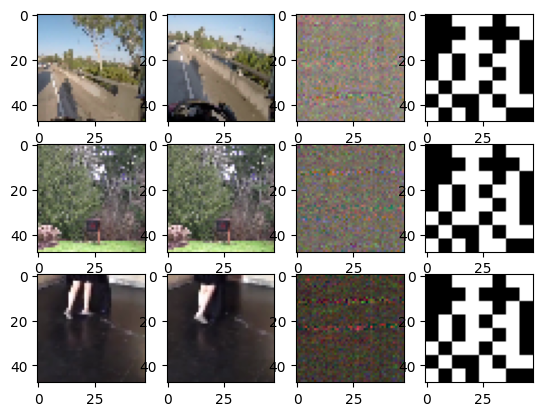

44it [02:10,  2.98s/it]                        


Epoch 1 Training loss: 74.30725346055142 Validation loss: 0.0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


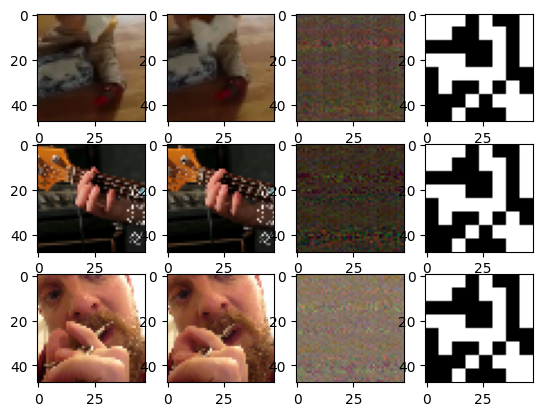

44it [02:05,  2.86s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 2 Training loss: 70.8623125830362 Validation loss: 0.0


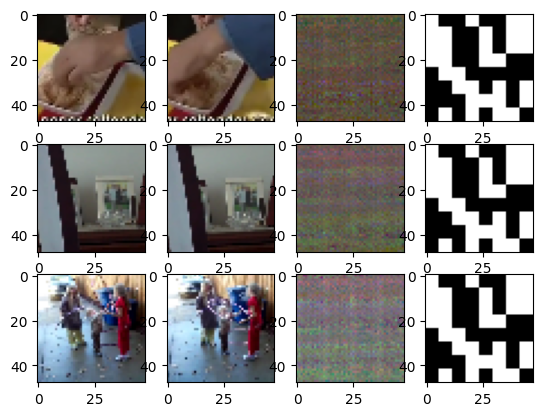

44it [02:01,  2.76s/it]                        


Epoch 3 Training loss: 71.03528665941815 Validation loss: 0.0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


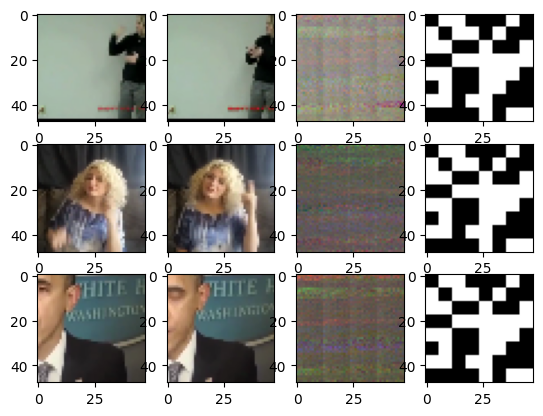

44it [02:03,  2.81s/it]                        


Epoch 4 Training loss: 68.54393324741098 Validation loss: 0.0


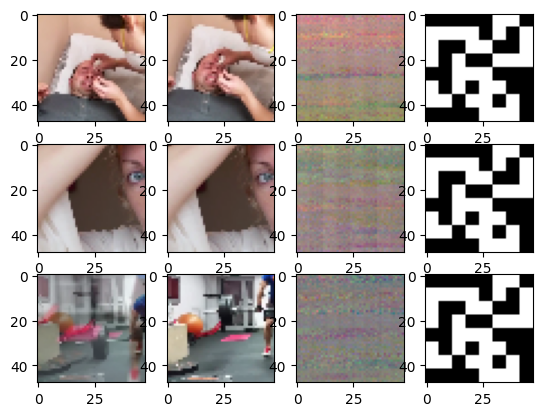

44it [02:07,  2.89s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 5 Training loss: 66.81522644397825 Validation loss: 0.0


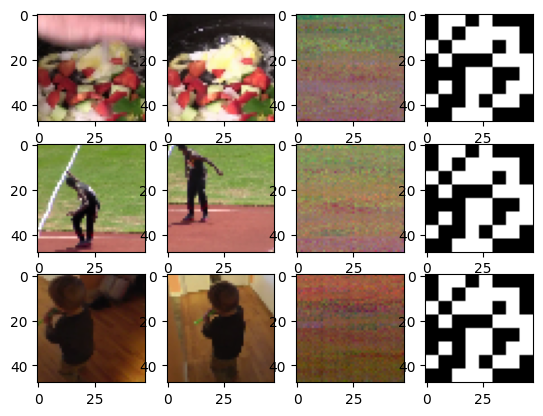

44it [02:10,  2.97s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 6 Training loss: 63.25581705847452 Validation loss: 0.0


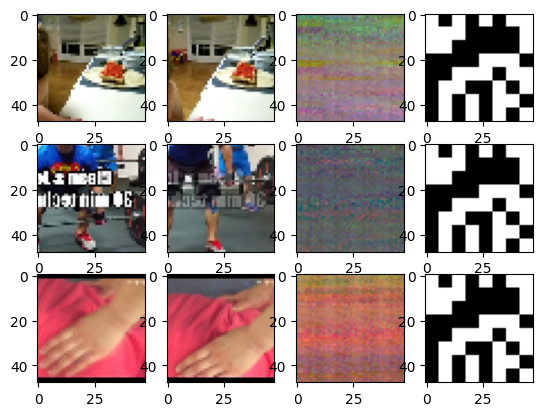

44it [02:23,  3.26s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 7 Training loss: 62.51685705850291 Validation loss: 0.0


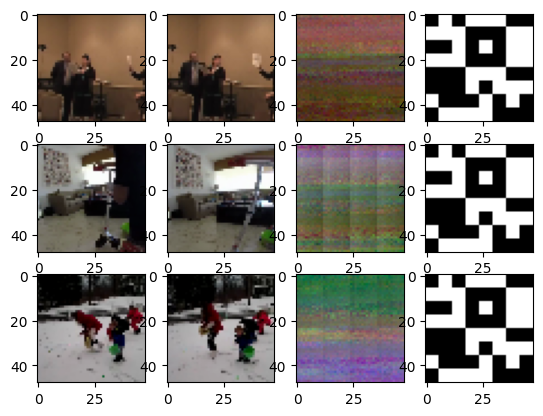

44it [02:22,  3.23s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 8 Training loss: 62.518657152042834 Validation loss: 0.0


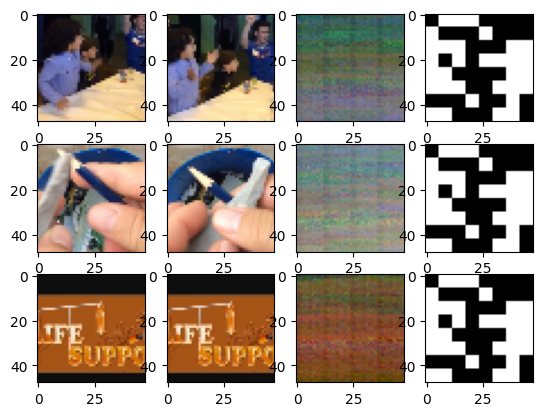

44it [02:29,  3.40s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 9 Training loss: 59.01775626249091 Validation loss: 0.0


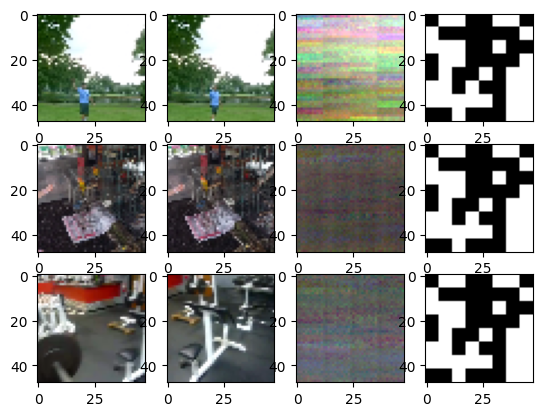

44it [02:25,  3.30s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 10 Training loss: 56.49486799018327 Validation loss: 0.0


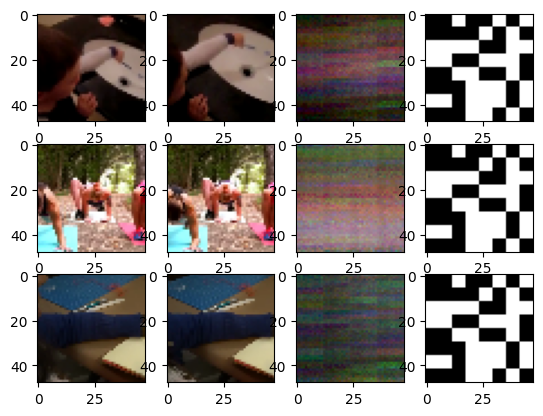

44it [02:31,  3.45s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 11 Training loss: 54.46710320406182 Validation loss: 0.0


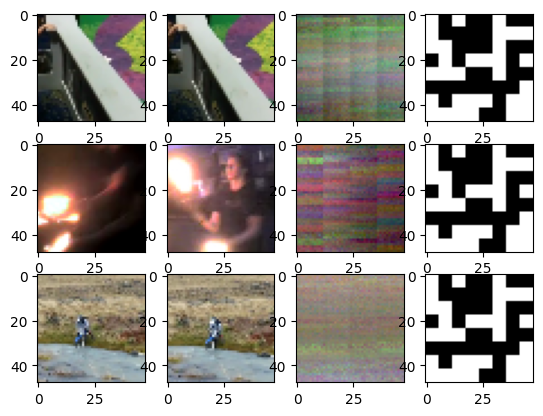

44it [02:25,  3.31s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 12 Training loss: 55.28693274564521 Validation loss: 0.0


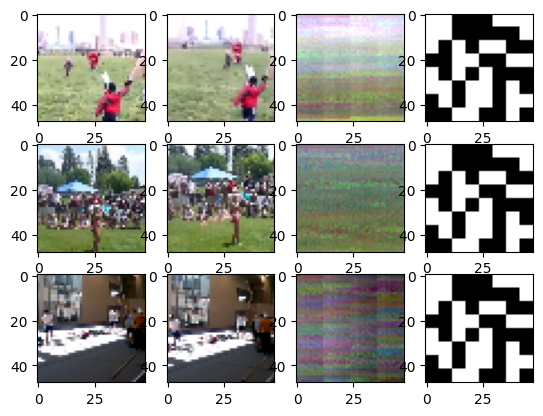

44it [02:26,  3.32s/it]                        


Epoch 13 Training loss: 54.36771818648937 Validation loss: 0.0


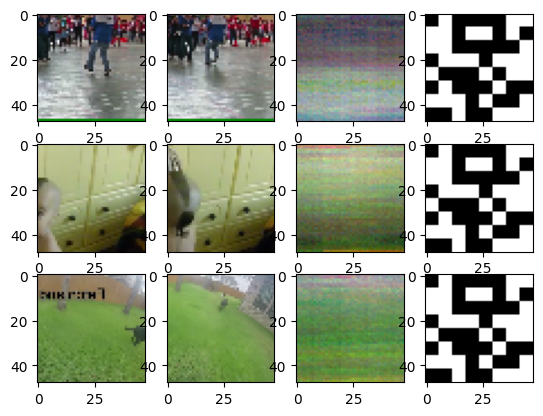

44it [02:33,  3.50s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 14 Training loss: 51.69933718304301 Validation loss: 0.0


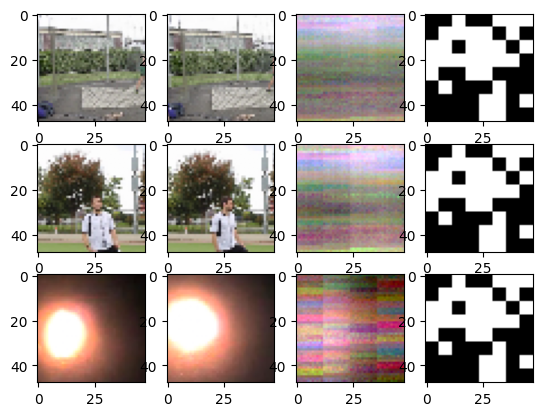

44it [02:31,  3.44s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 15 Training loss: 51.16942871448605 Validation loss: 0.0


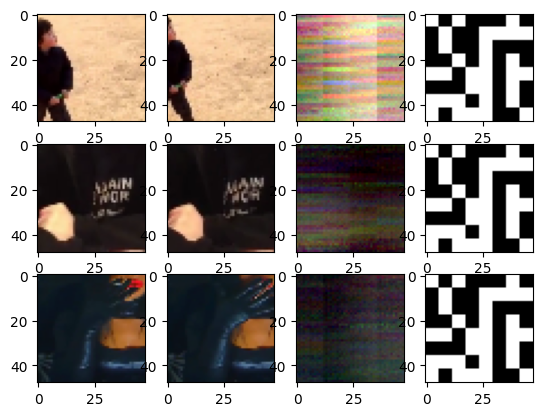

44it [02:37,  3.59s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 16 Training loss: 51.09080026316088 Validation loss: 0.0


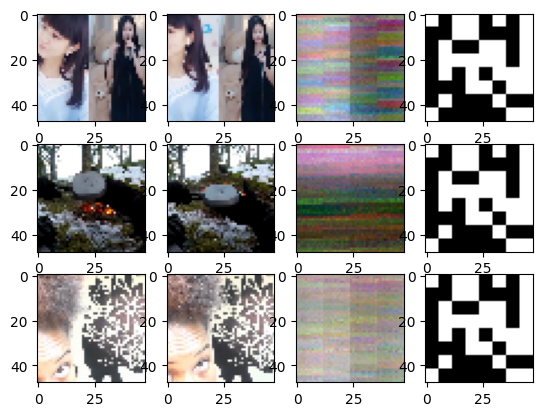

44it [02:31,  3.44s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 17 Training loss: 51.39438212195108 Validation loss: 0.0


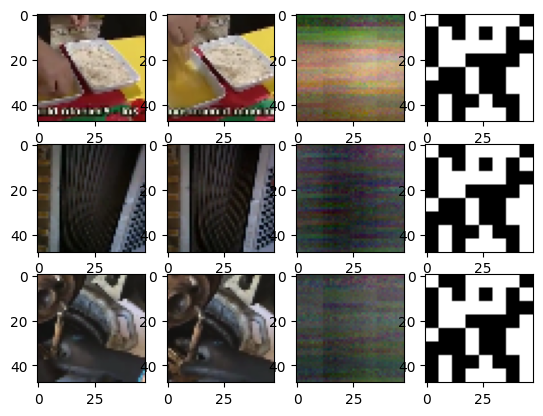

44it [02:18,  3.15s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 18 Training loss: 50.52260633956554 Validation loss: 0.0


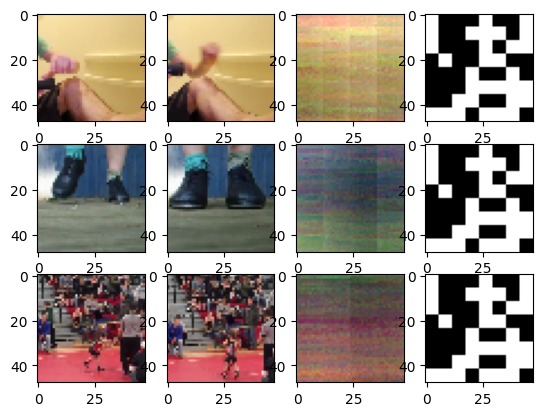

44it [02:08,  2.92s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 19 Training loss: 48.57475227533385 Validation loss: 0.0


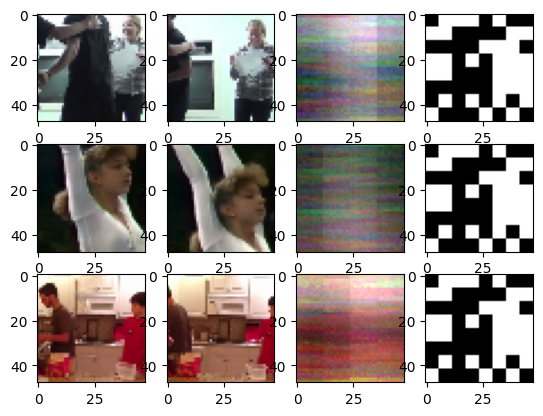

44it [02:12,  3.02s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 20 Training loss: 49.47126486135084 Validation loss: 0.0


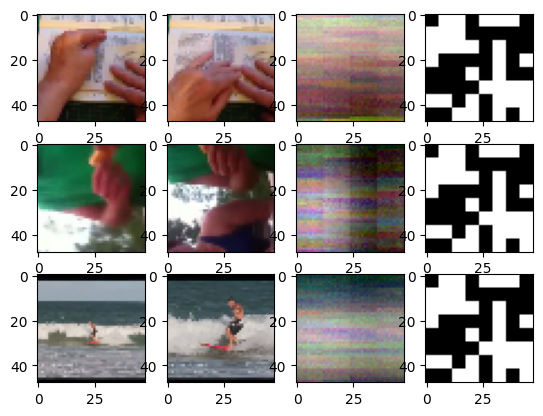

44it [02:22,  3.24s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 21 Training loss: 48.93720990558003 Validation loss: 0.0


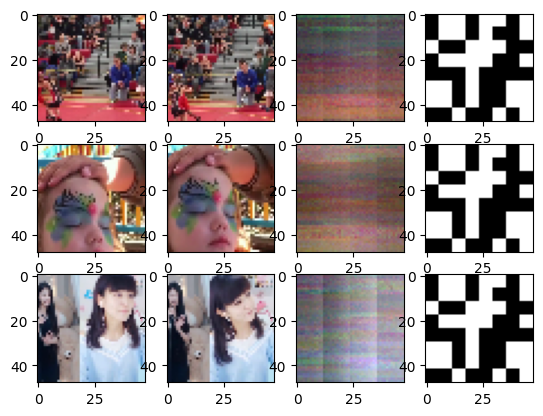

44it [02:42,  3.70s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 22 Training loss: 47.25845141743505 Validation loss: 0.0


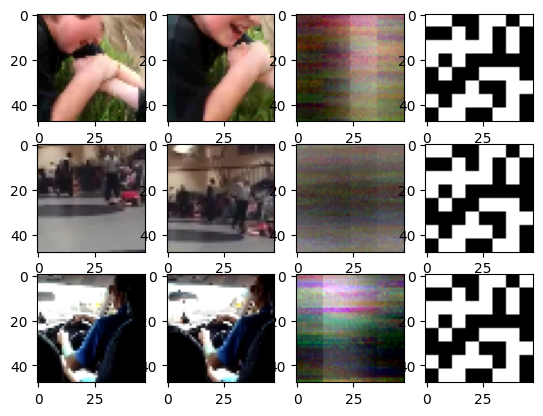

44it [02:14,  3.07s/it]                        


Epoch 23 Training loss: 48.042179373807684 Validation loss: 0.0


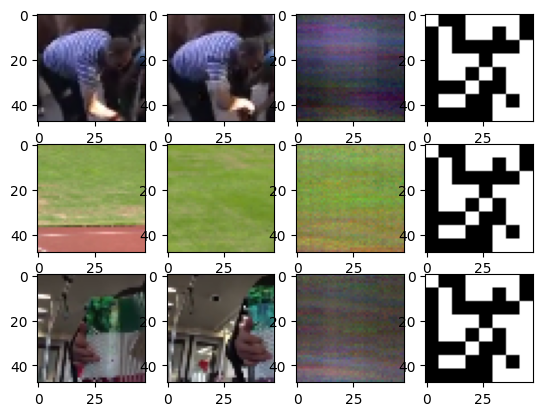

44it [02:13,  3.04s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 24 Training loss: 45.80242928793264 Validation loss: 0.0


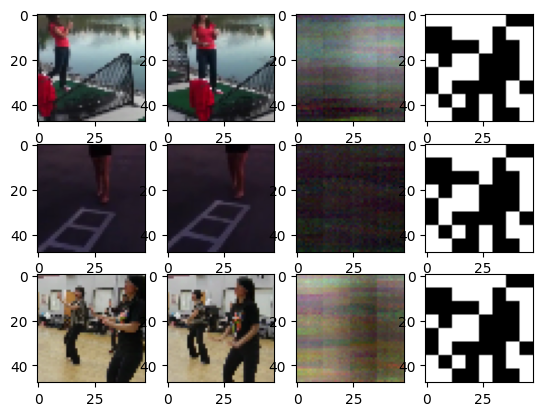

44it [02:13,  3.03s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 25 Training loss: 47.772215421809705 Validation loss: 0.0


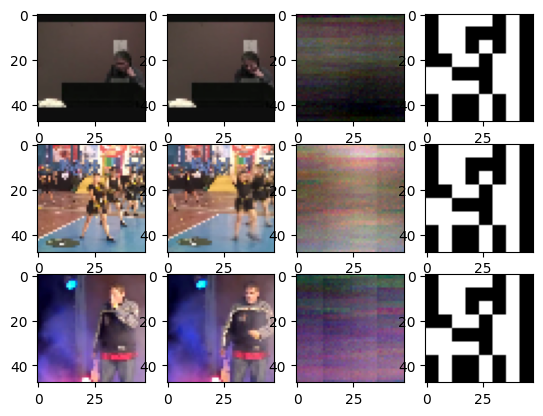

44it [02:14,  3.06s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 26 Training loss: 46.86204586472622 Validation loss: 0.0


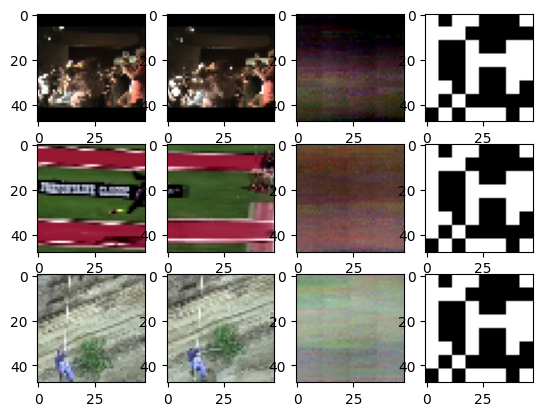

44it [02:11,  2.99s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 27 Training loss: 46.04019369081009 Validation loss: 0.0


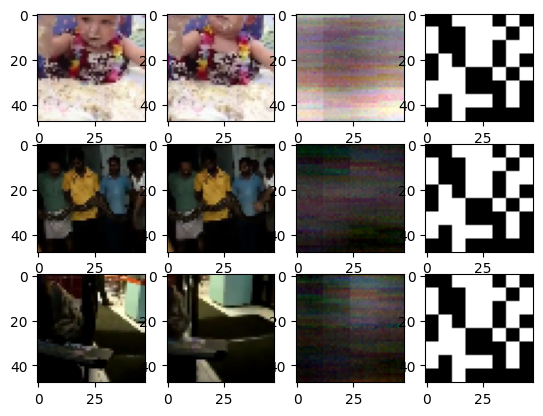

44it [02:15,  3.08s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 28 Training loss: 45.05937509758528 Validation loss: 0.0


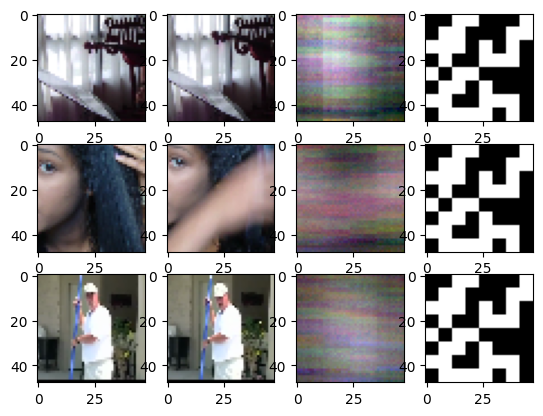

44it [02:13,  3.03s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 29 Training loss: 45.89732626981513 Validation loss: 0.0


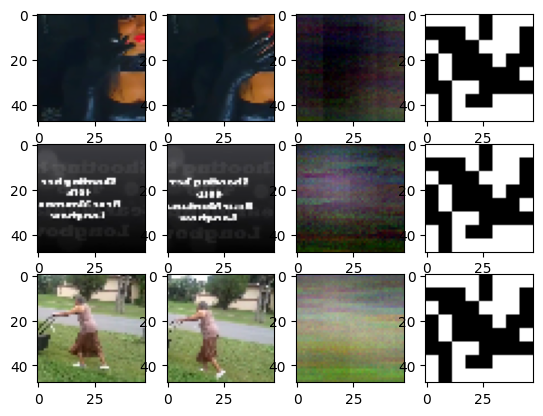

44it [02:16,  3.10s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 30 Training loss: 44.80416435419127 Validation loss: 0.0


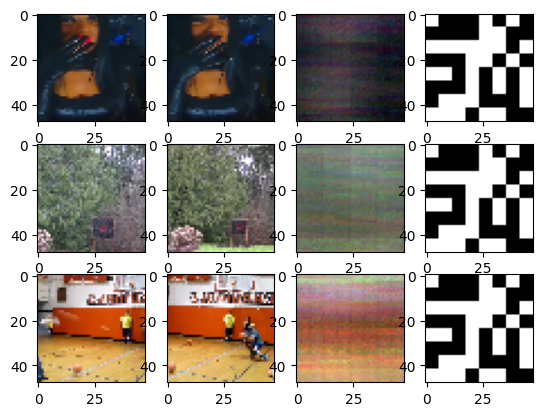

44it [02:08,  2.92s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 31 Training loss: 43.849596156630405 Validation loss: 0.0


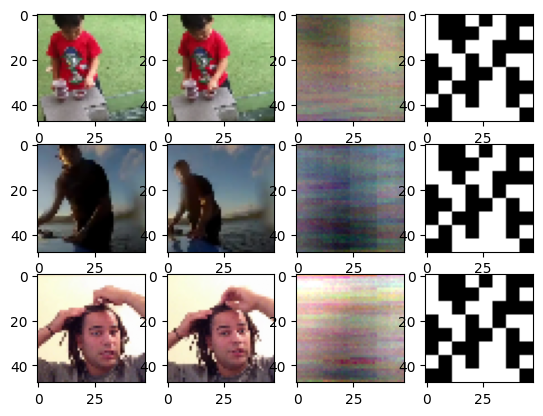

44it [02:09,  2.94s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 32 Training loss: 43.629864803580354 Validation loss: 0.0


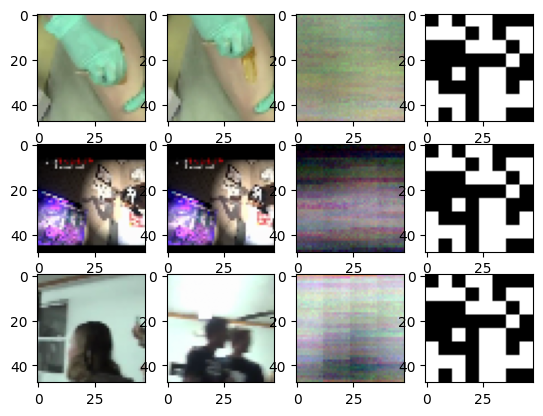

44it [02:11,  2.98s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 33 Training loss: 44.44209537949673 Validation loss: 0.0


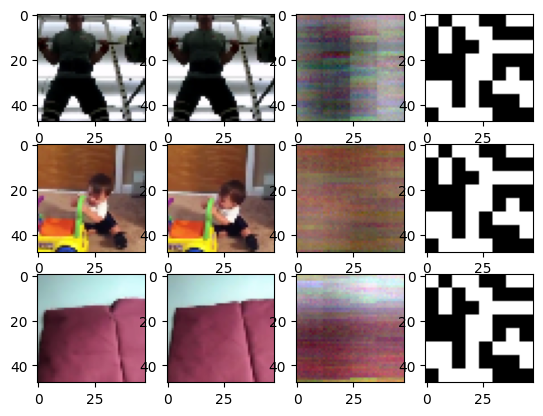

44it [02:11,  2.98s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 34 Training loss: 43.78142964562704 Validation loss: 0.0


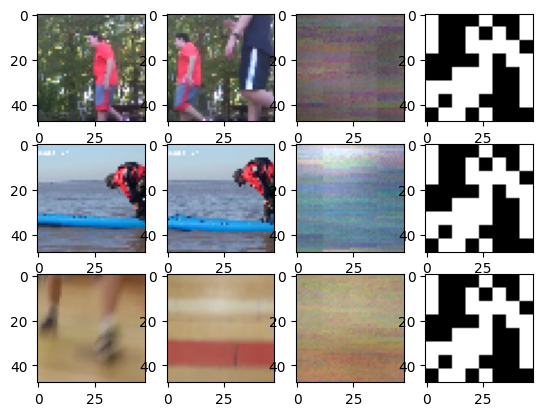

44it [02:06,  2.88s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 35 Training loss: 44.02153103850608 Validation loss: 0.0


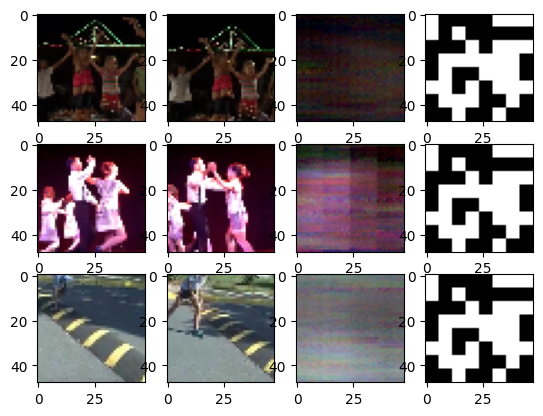

44it [02:11,  2.99s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 36 Training loss: 41.769510978876156 Validation loss: 0.0


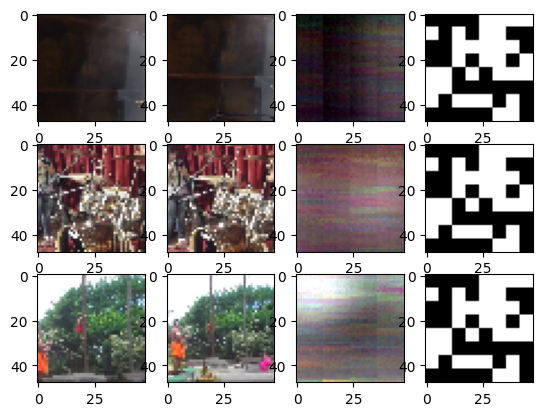

44it [02:05,  2.85s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 37 Training loss: 42.80952555634255 Validation loss: 0.0


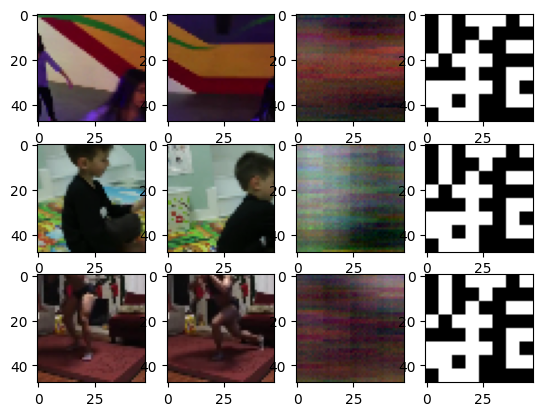

44it [02:09,  2.95s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 38 Training loss: 42.08515229336051 Validation loss: 0.0


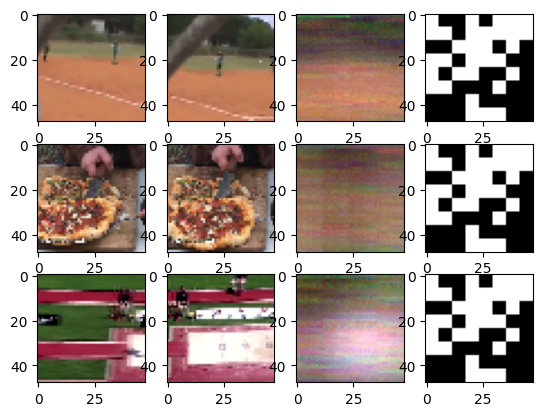

44it [02:05,  2.86s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 39 Training loss: 40.555739646734196 Validation loss: 0.0


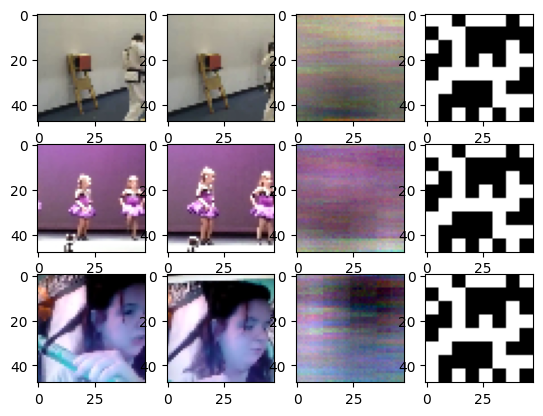

44it [02:08,  2.91s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 40 Training loss: 41.479809428370274 Validation loss: 0.0


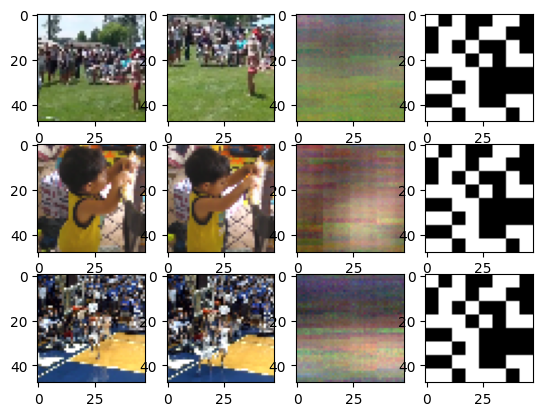

44it [02:07,  2.90s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 41 Training loss: 40.768886433091275 Validation loss: 0.0


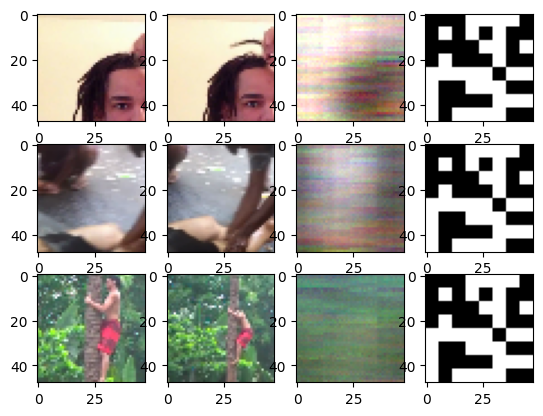

44it [02:06,  2.89s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 42 Training loss: 40.277528319247935 Validation loss: 0.0


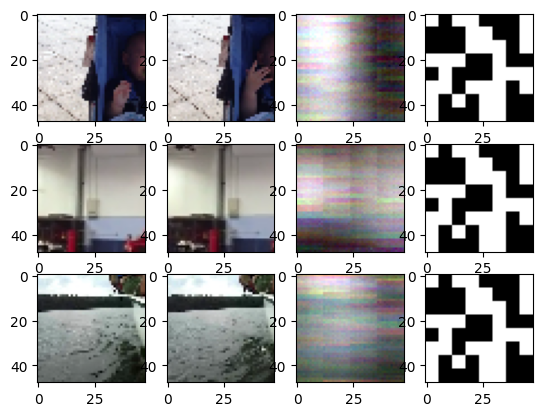

44it [02:11,  2.98s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 43 Training loss: 40.16925501268963 Validation loss: 0.0


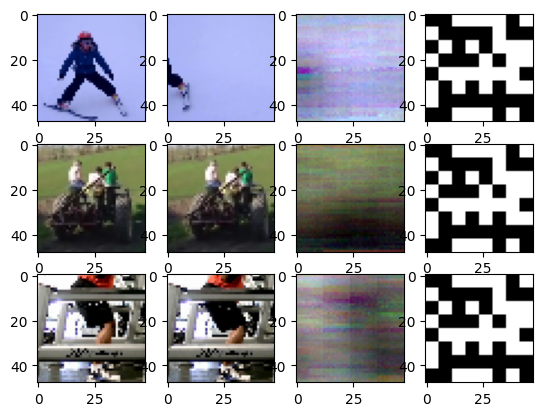

44it [02:07,  2.90s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 44 Training loss: 40.72168163920558 Validation loss: 0.0


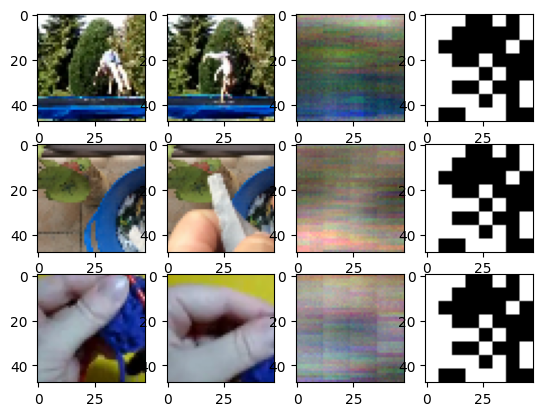

44it [02:04,  2.84s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 45 Training loss: 38.950334460236306 Validation loss: 0.0


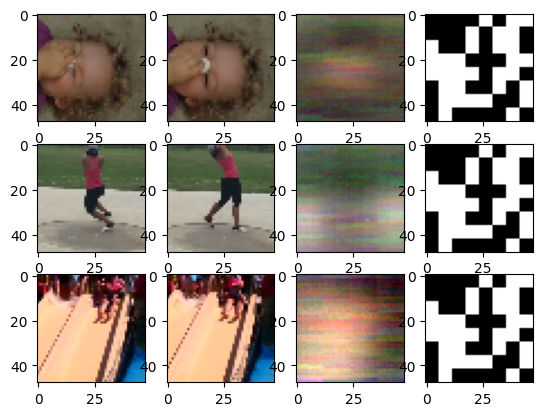

44it [02:10,  2.97s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 46 Training loss: 39.58974399123081 Validation loss: 0.0


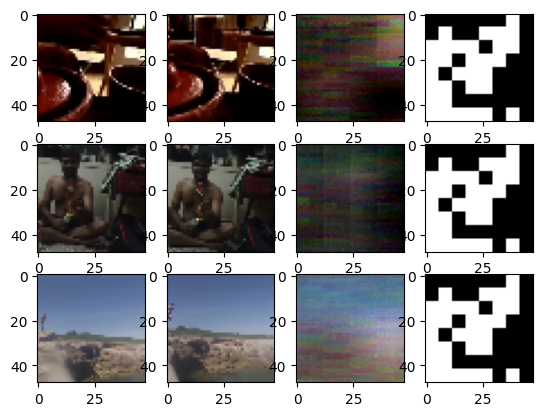

44it [02:02,  2.79s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 47 Training loss: 37.68975648214651 Validation loss: 0.0


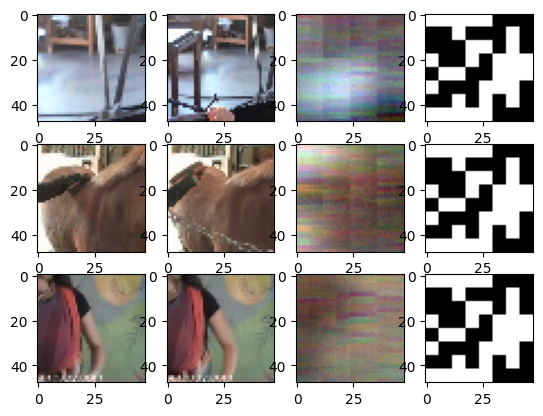

44it [02:13,  3.04s/it]                        


Epoch 48 Training loss: 39.36156698714855 Validation loss: 0.0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


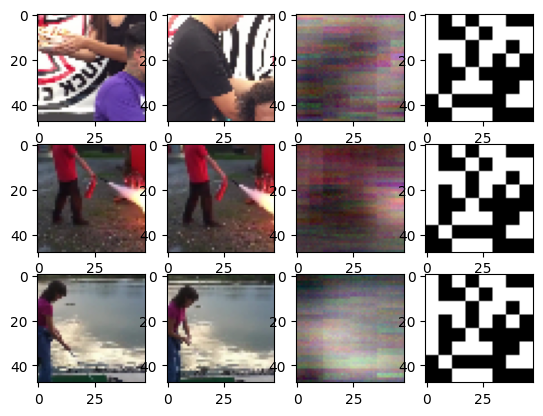

44it [02:12,  3.01s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 49 Training loss: 39.18036310062852 Validation loss: 0.0


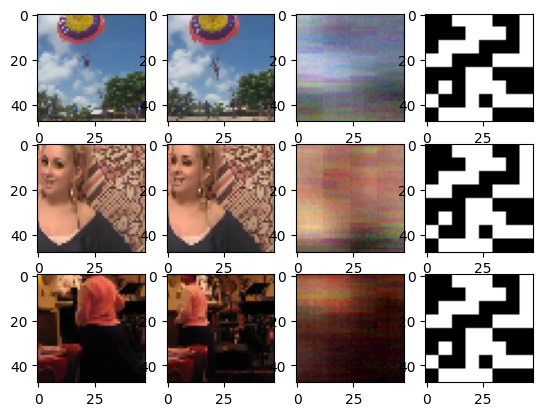

44it [02:04,  2.84s/it]                        


Epoch 50 Training loss: 37.93129628203636 Validation loss: 0.0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


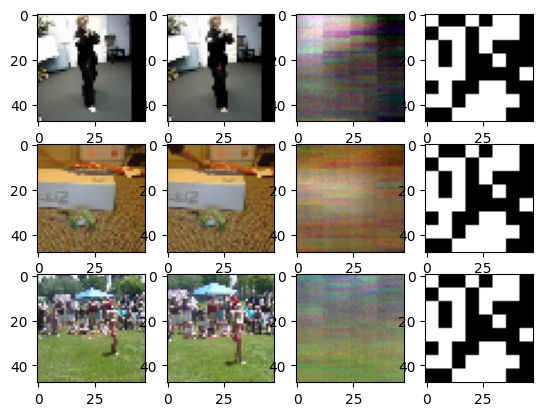

44it [02:02,  2.79s/it]                        


Epoch 51 Training loss: 37.59603123332179 Validation loss: 0.0


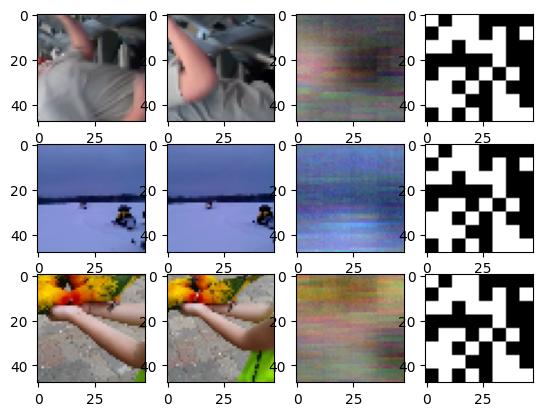

44it [02:07,  2.90s/it]                        


Epoch 52 Training loss: 38.04286193847656 Validation loss: 0.0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


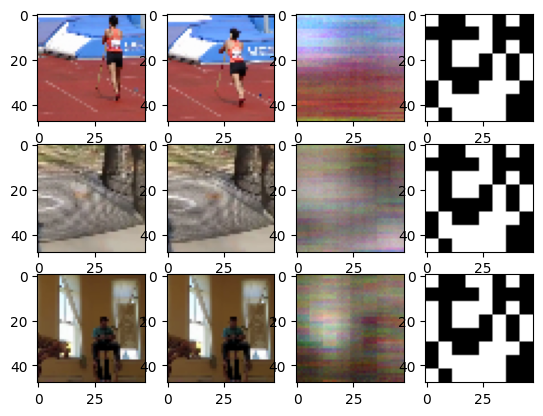

44it [02:05,  2.85s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 53 Training loss: 38.069081506063775 Validation loss: 0.0


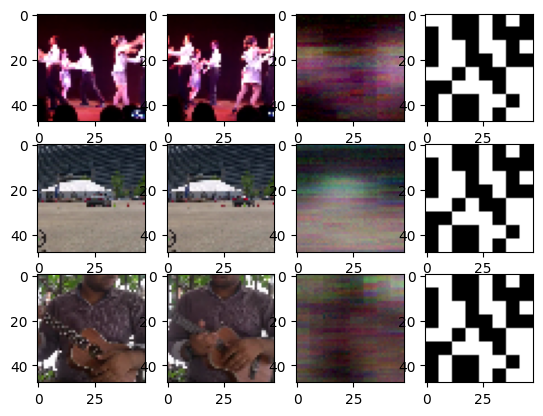

44it [02:11,  2.98s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 54 Training loss: 36.914924754652866 Validation loss: 0.0


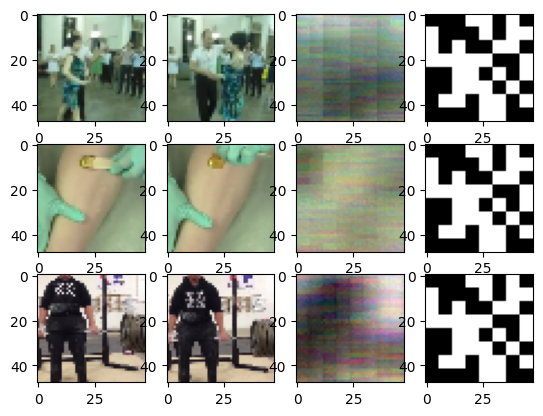

44it [02:04,  2.82s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 55 Training loss: 36.9480656468591 Validation loss: 0.0


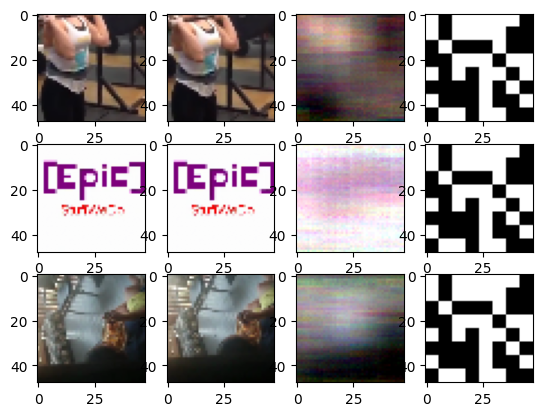

44it [02:06,  2.87s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 56 Training loss: 37.27613950330158 Validation loss: 0.0


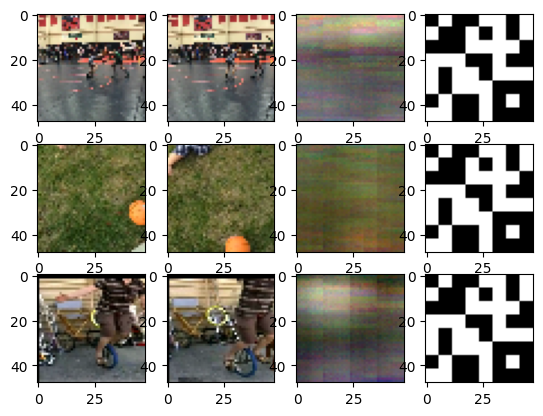

44it [02:01,  2.76s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 57 Training loss: 37.04492773011673 Validation loss: 0.0


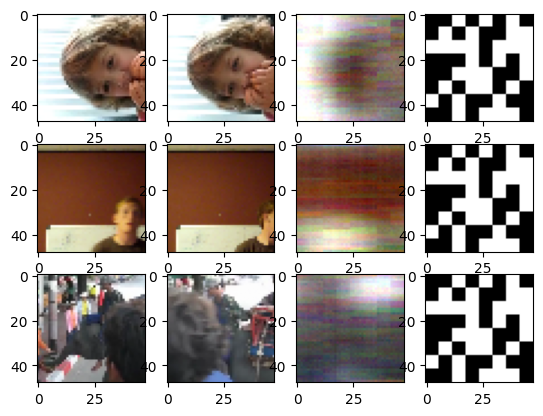

44it [02:03,  2.80s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 58 Training loss: 35.75667088530784 Validation loss: 0.0


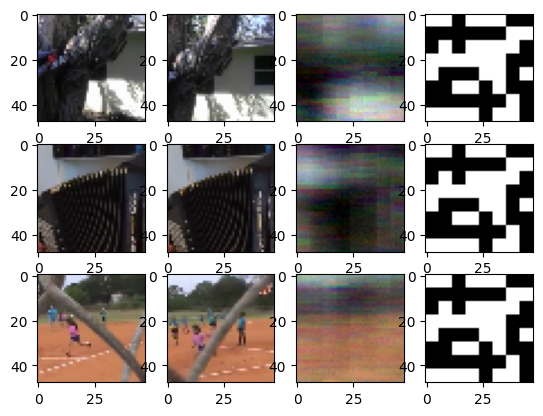

44it [02:01,  2.76s/it]                        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 59 Training loss: 36.48003556007563 Validation loss: 0.0


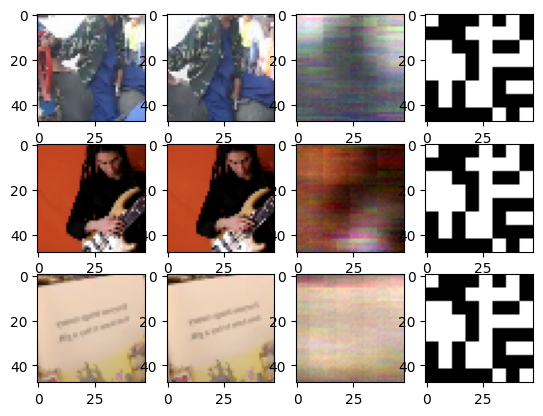

In [45]:
train_loss, val_loss = train(model, dloader, dloader, nn.MSELoss(reduction='none'), optimizer, 60)